# Import necessary libraries

In [1]:
import os
import glob
import torch
import cv2
import random
from tqdm import tqdm
import numpy as np
from torch import nn
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision.transforms import v2
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split

In [2]:
torch.manual_seed(42)

In [3]:
# Get cpu, gpu or mps device for training.
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

Using cuda device


In [4]:
mask_paths = glob.glob('/kaggle/input/lgg-mri-segmentation/kaggle_3m/*/*_mask*')
image_paths = [i.replace('_mask', '') for i in mask_paths]
print(f'{len(mask_paths)} {len(image_paths)}')

3929 3929


# Helper functions

In [5]:
def plot_from_img_path(n_examples, list_img_paths, list_mask_paths):
    
    fig, axs = plt.subplots(n_examples, 3, figsize=(20, n_examples*7), constrained_layout=True)
    i = 0
    for ax in axs:
        image, mask = list_img_paths[i], list_mask_paths[i]
        image, mask = cv2.imread(image), cv2.imread(mask)
        ax[0].set_title("MRI images")
        ax[0].imshow(image)
        ax[1].set_title("Highlited abnormality")
        ax[1].imshow(image)
        ax[1].imshow(mask, alpha=0.2)
        ax[2].imshow(mask)
        ax[2].set_title("Abnormality mask")
        i += 1
 

# Visualizing images and masks

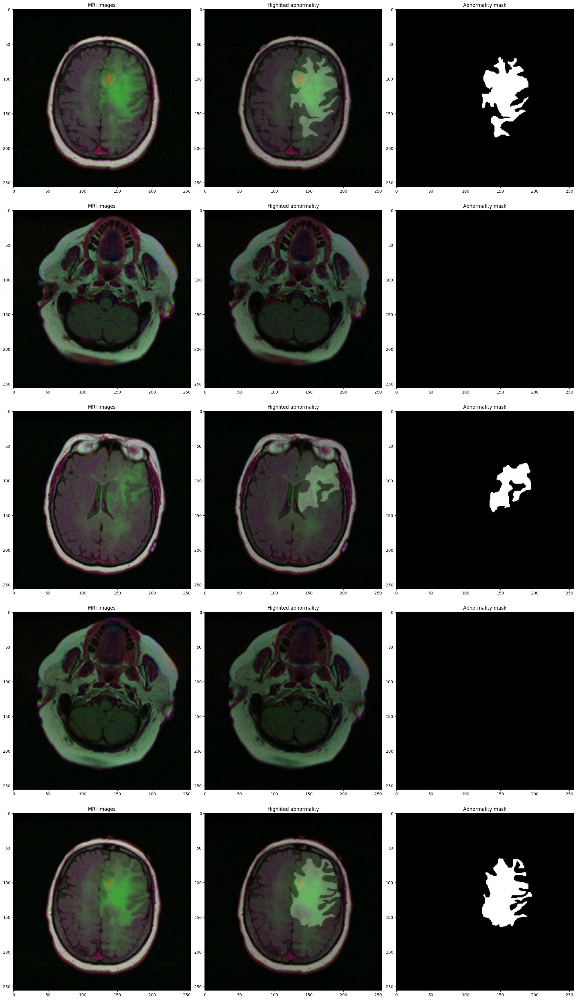

In [6]:
plot_from_img_path(n_examples=5, list_img_paths=image_paths[5:], list_mask_paths=mask_paths[5:])

# Create dataframe and split dataset into train, val and test sets

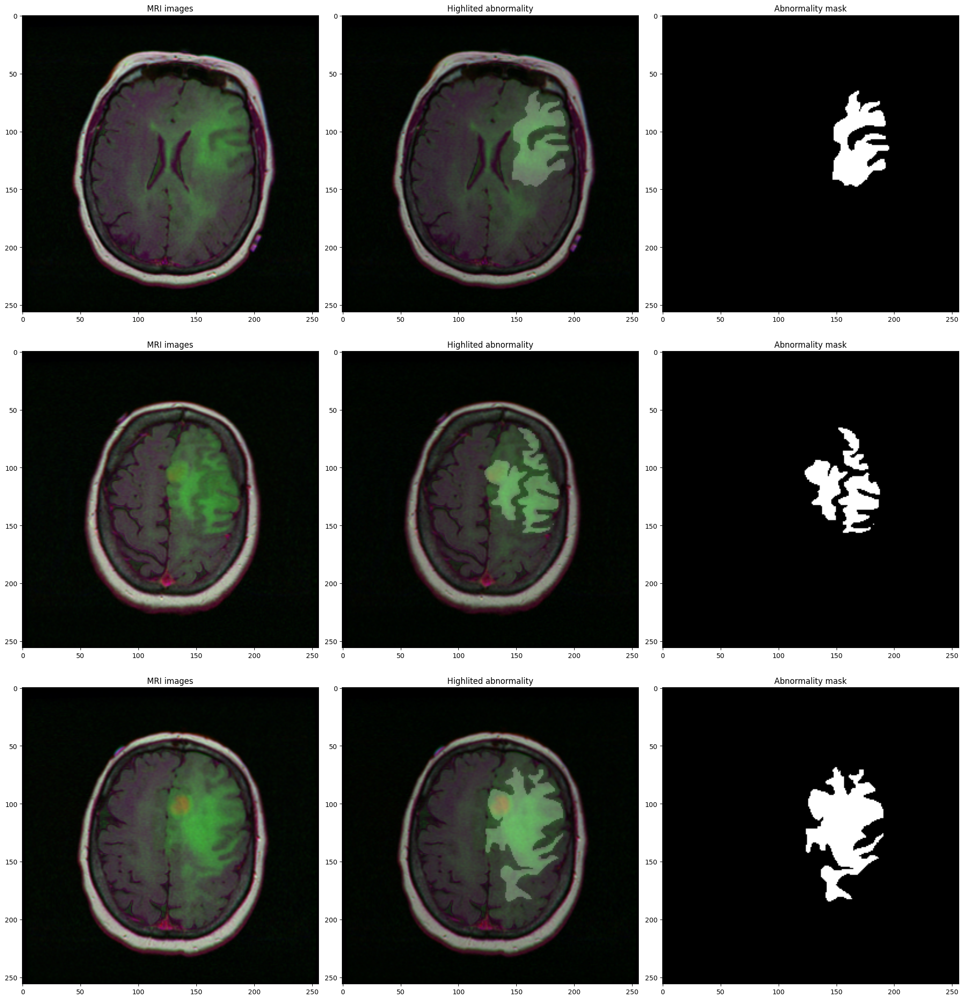

In [7]:
df = pd.DataFrame(data={'image': image_paths, 'mask': mask_paths})
df.head()
plot_from_img_path(n_examples=3, list_img_paths=df.iloc[[3,4,5],0].tolist(), list_mask_paths=df.iloc[[3,4,5],1].tolist())

In [8]:
df_train, df_test = train_test_split(df, test_size=0.3, random_state=42)
df_test, df_val = train_test_split(df_test, test_size=0.3, random_state=42)

print('train')
print(f"{df_train.describe().loc['count', ['image', 'mask']]}\n")
print('val')
print(f"{df_val.describe().loc['count', ['image', 'mask']]}\n")
print('test')
print(f"{df_test.describe().loc['count', ['image', 'mask']]}\n")

train
image    2750
mask     2750
Name: count, dtype: object

val
image    354
mask     354
Name: count, dtype: object

test
image    825
mask     825
Name: count, dtype: object



In [9]:
class MRI_Dataset(Dataset):
    def __init__(self, df, img_transform=None, mask_transform=None):
        self.image_paths = df['image']
        self.mask_paths = df['mask']
        self.img_transform = img_transform
        self.mask_transform = mask_transform
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_file = self.image_paths.iloc[idx]
        mask_file = self.mask_paths.iloc[idx]
        
        img = cv2.imread(img_file, cv2.IMREAD_UNCHANGED)
        mask = cv2.imread(mask_file, cv2.IMREAD_GRAYSCALE)

        if self.img_transform:
            img = self.img_transform(img)
        if self.mask_transform:
            mask = self.mask_transform(mask)
        
        return img, mask

In [10]:
train_img_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])
train_mask_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


In [11]:
val_img_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])
val_mask_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])

In [12]:
test_img_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])
test_mask_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])

In [13]:
train_dataset = MRI_Dataset(df_train, img_transform=train_img_transform, mask_transform=train_mask_transform)
val_dataset = MRI_Dataset(df_val, img_transform=val_img_transform, mask_transform=val_mask_transform)
test_dataset = MRI_Dataset(df_test, img_transform=test_img_transform, mask_transform=test_mask_transform)

In [14]:
batch_size = 16

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size)

In [15]:
for img, mask in train_dataloader:
    print(img.shape)
    print(mask.shape)
    break

torch.Size([16, 3, 256, 256])
torch.Size([16, 1, 256, 256])


In [16]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(ConvBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
    
    def forward(self, x):
        return self.relu(self.bn(self.conv(x)))

class CustomBackbone(nn.Module):
    def __init__(self):
        super(CustomBackbone, self).__init__()
        self.layer1 = ConvBlock(3, 64, 3, 2, 1)  # Downsample
        self.layer2 = ConvBlock(64, 128, 3, 2, 1) # Downsample
        self.layer3 = ConvBlock(128, 256, 3, 2, 1) # Downsample
        self.layer4 = ConvBlock(256, 512, 3, 2, 1) # Downsample
    
    def forward(self, x):
        c1 = self.layer1(x)
        c2 = self.layer2(c1)
        c3 = self.layer3(c2)
        c4 = self.layer4(c3)
        return c1, c2, c3, c4

class FPN(nn.Module):
    def __init__(self, in_channels=[64, 128, 256, 512], out_channels=256):
        super(FPN, self).__init__()
        self.lateral_convs = nn.ModuleList([nn.Conv2d(ch, out_channels, 1) for ch in in_channels])
        self.smooth_convs = nn.ModuleList([ConvBlock(out_channels, out_channels, 3, 1, 1) for _ in in_channels])
    
    def forward(self, features):
        p4 = self.lateral_convs[3](features[3])
        p3 = self._upsample_add(p4, self.lateral_convs[2](features[2]))
        p2 = self._upsample_add(p3, self.lateral_convs[1](features[1]))
        p1 = self._upsample_add(p2, self.lateral_convs[0](features[0]))
        
        return [self.smooth_convs[i](p) for i, p in enumerate([p1, p2, p3, p4])]
    
    def _upsample_add(self, x, y):
        return F.interpolate(x, size=y.shape[2:], mode='bilinear', align_corners=False) + y

class SegmentationHead(nn.Module):
    def __init__(self, in_channels, out_channels, num_classes=1):
        super(SegmentationHead, self).__init__()
        self.conv1 = ConvBlock(in_channels, out_channels, 3, 1, 1)
        self.conv2 = nn.Conv2d(out_channels, num_classes, 1)
    
    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        return F.interpolate(x, size=(256, 256), mode='bilinear', align_corners=False)

class FPN_Segmentation(nn.Module):
    def __init__(self, num_classes=1):
        super(FPN_Segmentation, self).__init__()
        self.backbone = CustomBackbone()
        self.fpn = FPN()
        self.head = SegmentationHead(256, 128, num_classes)
    
    def forward(self, x):
        features = self.backbone(x)
        fpn_features = self.fpn(features)
        return self.head(fpn_features[0])

# Model initialization
model = FPN_Segmentation(num_classes=1)

# Training loop
def train_model(model, train_loader, val_loader, epochs=10, lr=0.001):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = nn.BCEWithLogitsLoss()
    train_losses, val_losses = [], []
    
    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
        train_loss /= len(train_loader)
        train_losses.append(train_loss)
        
        model.eval()
        val_loss = 0
        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                loss = criterion(outputs, masks)
                val_loss += loss.item()
        val_loss /= len(val_loader)
        val_losses.append(val_loss)
        
        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
    
    # Plot loss curves
    plt.plot(range(1, epochs+1), train_losses, label='Train Loss')
    plt.plot(range(1, epochs+1), val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training and Validation Loss')
    plt.show()

# Test with a sample input
x = torch.randn(16, 3, 256, 256)  # Batch of 16 images
output = model(x)
print(output.shape)  # Expected: torch.Size([16, 1, 256, 256])

torch.Size([16, 1, 256, 256])


Epoch 1/20, Train Loss: 0.0789, Val Loss: 0.0373
Epoch 2/20, Train Loss: 0.0288, Val Loss: 0.0277
Epoch 3/20, Train Loss: 0.0248, Val Loss: 0.0333
Epoch 4/20, Train Loss: 0.0225, Val Loss: 0.0553
Epoch 5/20, Train Loss: 0.0222, Val Loss: 0.0224
Epoch 6/20, Train Loss: 0.0195, Val Loss: 0.0224
Epoch 7/20, Train Loss: 0.0189, Val Loss: 0.0224
Epoch 8/20, Train Loss: 0.0180, Val Loss: 0.0238
Epoch 9/20, Train Loss: 0.0167, Val Loss: 0.0188
Epoch 10/20, Train Loss: 0.0169, Val Loss: 0.0189
Epoch 11/20, Train Loss: 0.0158, Val Loss: 0.0169
Epoch 12/20, Train Loss: 0.0157, Val Loss: 0.0179
Epoch 13/20, Train Loss: 0.0143, Val Loss: 0.0155
Epoch 14/20, Train Loss: 0.0134, Val Loss: 0.0161
Epoch 15/20, Train Loss: 0.0125, Val Loss: 0.0161
Epoch 16/20, Train Loss: 0.0127, Val Loss: 0.0174
Epoch 17/20, Train Loss: 0.0119, Val Loss: 0.0140
Epoch 18/20, Train Loss: 0.0112, Val Loss: 0.0128
Epoch 19/20, Train Loss: 0.0105, Val Loss: 0.0158
Epoch 20/20, Train Loss: 0.0101, Val Loss: 0.0141


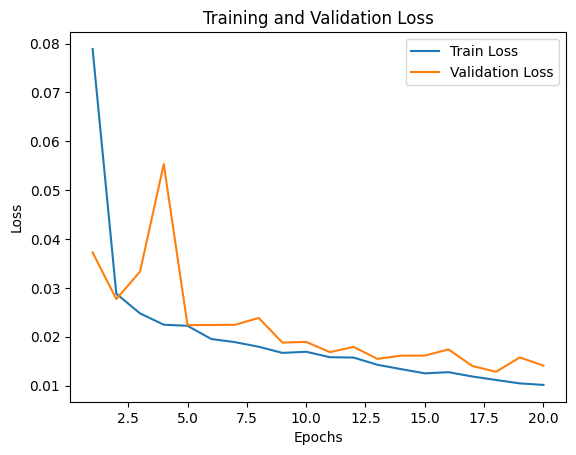

In [17]:
train_model(model, train_dataloader, val_dataloader, epochs=20)

# Test set evaluation

In [18]:
for name, param in model.named_parameters():
    print(f"{name} is on {param.device}")

backbone.layer1.conv.weight is on cuda:0
backbone.layer1.bn.weight is on cuda:0
backbone.layer1.bn.bias is on cuda:0
backbone.layer2.conv.weight is on cuda:0
backbone.layer2.bn.weight is on cuda:0
backbone.layer2.bn.bias is on cuda:0
backbone.layer3.conv.weight is on cuda:0
backbone.layer3.bn.weight is on cuda:0
backbone.layer3.bn.bias is on cuda:0
backbone.layer4.conv.weight is on cuda:0
backbone.layer4.bn.weight is on cuda:0
backbone.layer4.bn.bias is on cuda:0
fpn.lateral_convs.0.weight is on cuda:0
fpn.lateral_convs.0.bias is on cuda:0
fpn.lateral_convs.1.weight is on cuda:0
fpn.lateral_convs.1.bias is on cuda:0
fpn.lateral_convs.2.weight is on cuda:0
fpn.lateral_convs.2.bias is on cuda:0
fpn.lateral_convs.3.weight is on cuda:0
fpn.lateral_convs.3.bias is on cuda:0
fpn.smooth_convs.0.conv.weight is on cuda:0
fpn.smooth_convs.0.bn.weight is on cuda:0
fpn.smooth_convs.0.bn.bias is on cuda:0
fpn.smooth_convs.1.conv.weight is on cuda:0
fpn.smooth_convs.1.bn.weight is on cuda:0
fpn.smoo

In [19]:
torch.save(model.state_dict(), "fpn_segmentation_weights.pth")

In [30]:
criterion = nn.BCEWithLogitsLoss()
def test_set_evaluation(models):
    for key, model in models.items():
        with torch.no_grad():
            running_loss = 0
            for i, data in enumerate(test_dataloader):
                img, mask = data
                img, mask = img.to(device), mask.to(device)
                predictions = model(img)
                loss = criterion(predictions, mask)
                running_loss += loss.item() * img.size(0)
            loss = running_loss / len(test_dataset)
            
            print(f'Test loss with {key}: {loss}')

In [31]:
test_set_evaluation({"current_model": model})

Test loss with current_model: 0.014641713770953092


In [20]:
def visualize_segmentation(model, dataloader, num_examples=1):
    model.eval()  

    # Get all indices of the dataset and randomly sample 'num_examples' indices
    dataset_size = len(dataloader.dataset)
    random_indices = random.sample(range(dataset_size), num_examples)

    for idx in random_indices:
        img, mask = dataloader.dataset[idx]  # Access the dataset by index
        img, mask = img.to(device).unsqueeze(0), mask.to(device).unsqueeze(0)  # Add batch dimension

        with torch.no_grad():
            pred = model(img)

        # Squeeze to remove batch and channel dimensions
        img = img.squeeze(0).permute(1, 2, 0).cpu().numpy()  # Convert to HWC format for display
        mask = mask.squeeze(0).squeeze(0).cpu().numpy()
        pred = pred.squeeze(0).squeeze(0).cpu().numpy()
        binary_pred = pred > 0.5

        # Plot
        fig, axes = plt.subplots(1, 4, figsize=(12, 4))
        axes[0].imshow(img, cmap='gray' if img.shape[-1] == 1 else None)
        axes[0].set_title('Input Image')
        axes[0].axis('off')

        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title('True Mask')
        axes[1].axis('off')

        axes[2].imshow(pred, cmap='gray')
        axes[2].set_title('Predicted Mask')
        axes[2].axis('off')

        axes[3].imshow(binary_pred, cmap='gray')
        axes[3].set_title('Binary Predicted Mask')
        axes[3].axis('off')

        plt.tight_layout()
        plt.show()


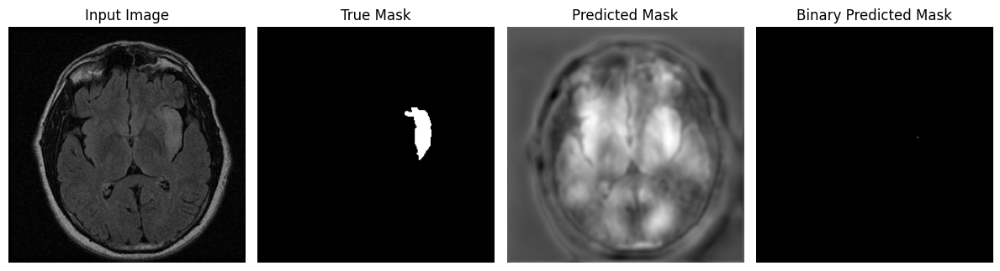

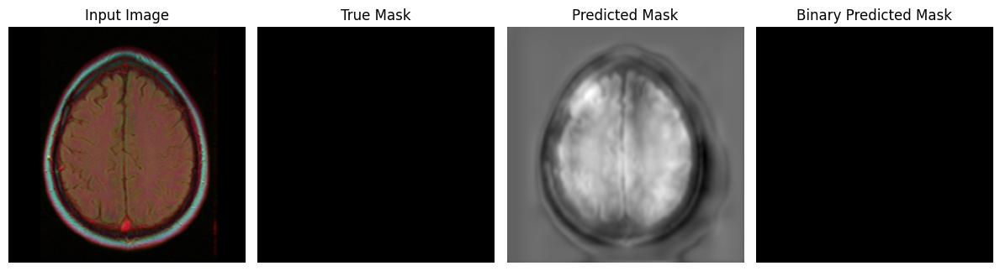

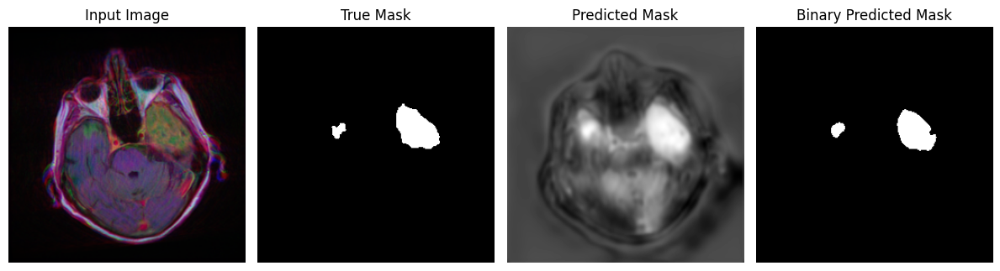

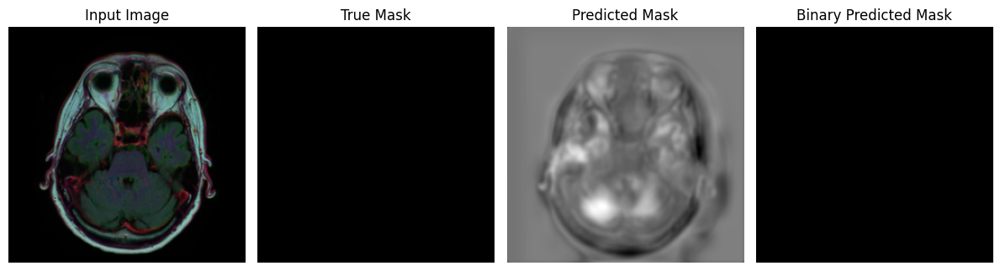

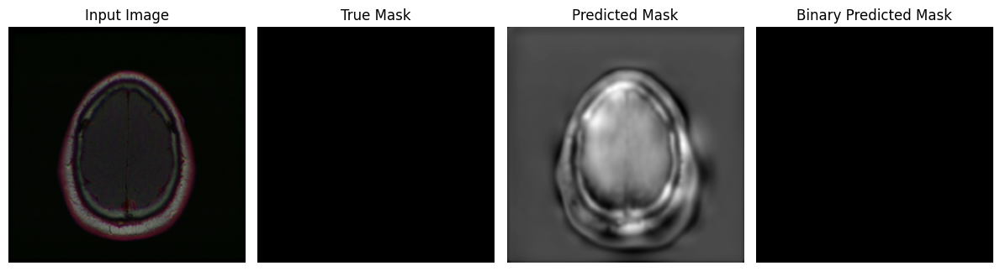

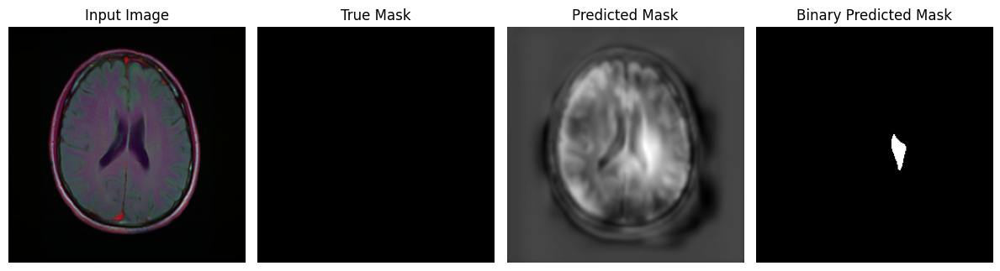

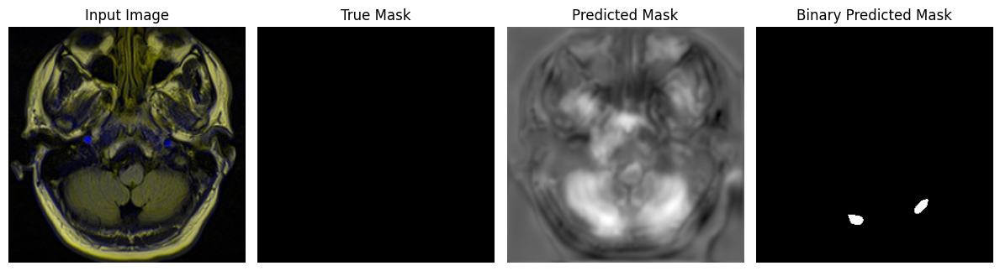

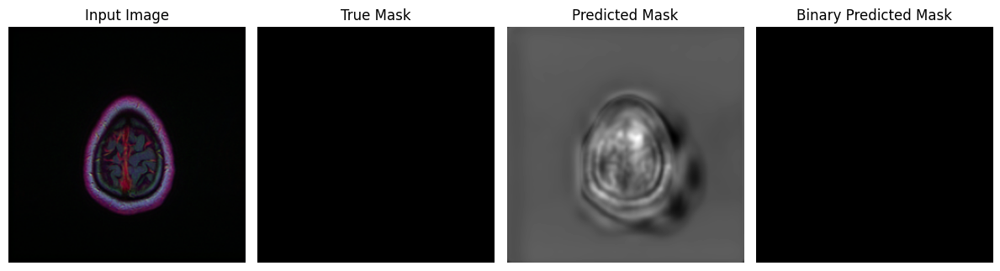

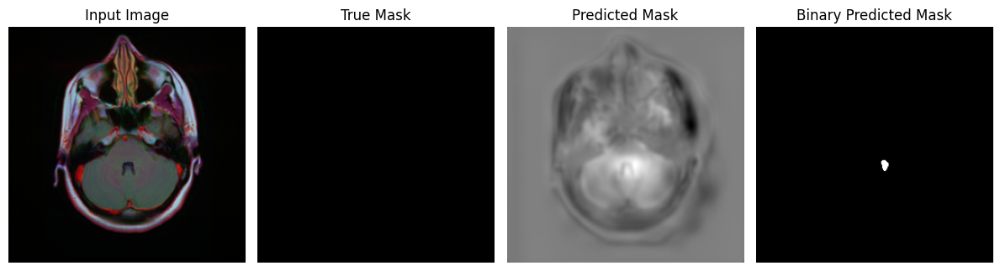

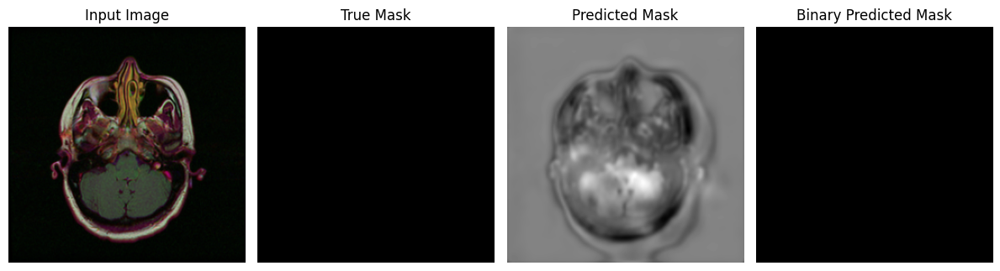

In [21]:
visualize_segmentation(model, test_dataloader, 10)

# Models benchmarking with different epochs

In [22]:
from skimage.segmentation import mark_boundaries

def dice_score(pred, target, epsilon=1e-6):
    """Computes Dice Similarity Coefficient (DSC)."""
    pred = pred > 0.5  # Convert to binary mask
    target = target > 0.5
    
    intersection = np.sum(pred * target)
    return (2. * intersection + epsilon) / (np.sum(pred) + np.sum(target) + epsilon)

def iou_score(pred, target, epsilon=1e-6):
    """Computes Intersection over Union (IoU)."""
    pred = pred > 0.5
    target = target > 0.5
    
    intersection = np.sum(pred * target)
    union = np.sum(pred) + np.sum(target) - intersection
    return (intersection + epsilon) / (union + epsilon)

def visualize_segmentation_new(model, dataloader, num_examples=1, device='cuda'):
    model.eval()
    dataset_size = len(dataloader.dataset)
    random_indices = random.sample(range(dataset_size), num_examples)

    for idx in random_indices:
        img, mask = dataloader.dataset[idx]  
        img, mask = img.to(device).unsqueeze(0), mask.to(device).unsqueeze(0)  

        with torch.no_grad():
            pred = model(img)

        # Convert tensors to numpy arrays
        img = img.squeeze(0).permute(1, 2, 0).cpu().numpy()  
        mask = mask.squeeze(0).squeeze(0).cpu().numpy()
        pred = pred.squeeze(0).squeeze(0).cpu().numpy()
        binary_pred = pred > 0.5  

        # Compute Dice and IoU scores
        dice = dice_score(binary_pred, mask)
        iou = iou_score(binary_pred, mask)

        # Normalize image for display
        img = (img - img.min()) / (img.max() - img.min())

        # Convert masks to integer type for mark_boundaries
        mask_int = mask.astype(int)
        binary_pred_int = binary_pred.astype(int)

        # Overlay segmentation boundaries on MRI image
        img_gt_overlay = mark_boundaries(img, mask_int, color=(0, 1, 0))  
        img_pred_overlay = mark_boundaries(img_gt_overlay, binary_pred_int, color=(1, 0, 0))  

        # Plot results
        fig, axes = plt.subplots(1, 5, figsize=(15, 4))
        axes[0].imshow(img, cmap='gray' if img.shape[-1] == 1 else None)
        axes[0].set_title('Input Image')
        axes[0].axis('off')

        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title('True Mask')
        axes[1].axis('off')

        axes[2].imshow(pred, cmap='gray')
        axes[2].set_title('Predicted Mask')
        axes[2].axis('off')

        axes[3].imshow(binary_pred, cmap='gray')
        axes[3].set_title('Binary Predicted Mask')
        axes[3].axis('off')

        axes[4].imshow(img_pred_overlay)
        axes[4].set_title(f'Overlay: GT (Green) & Pred (Red)\nDice: {dice:.4f}, IoU: {iou:.4f}')
        axes[4].axis('off')

        print(dice, iou)
        plt.tight_layout()
        plt.show()


1.0 1.0


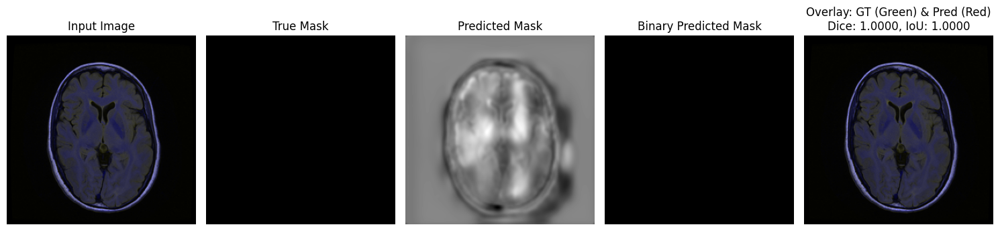

1.0 1.0


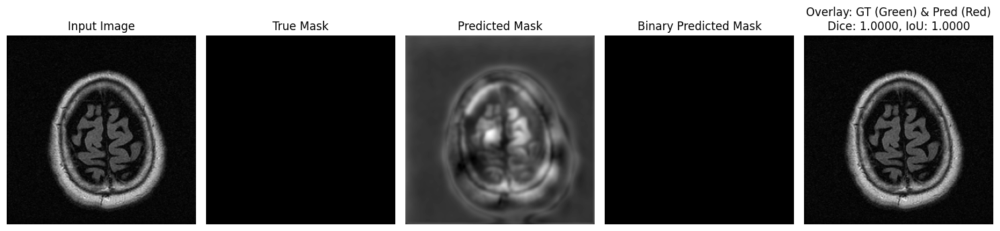

1.0 1.0


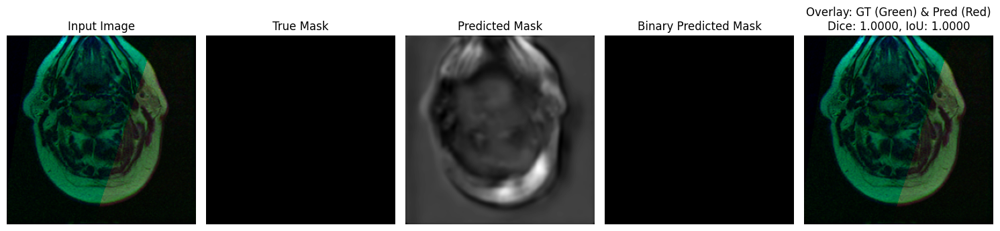

1.0 1.0


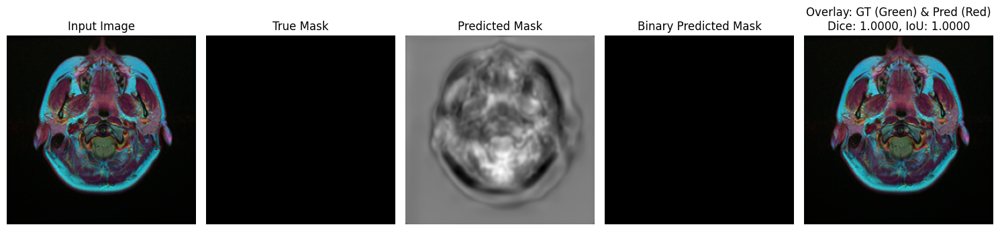

1.0 1.0


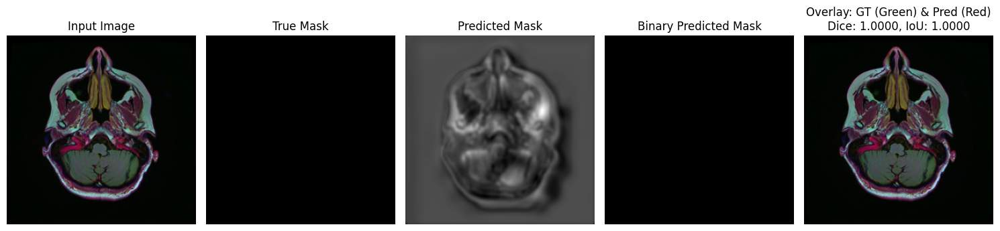

1.0 1.0


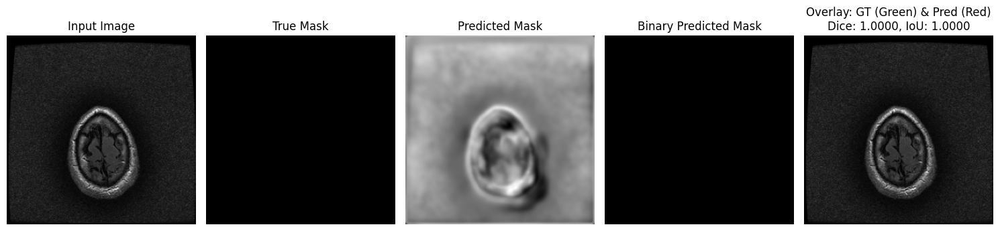

6.8965516765755055e-09 6.8965516765755055e-09


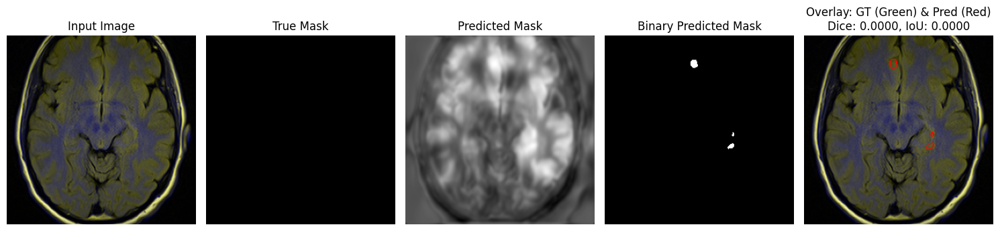

1.0 1.0


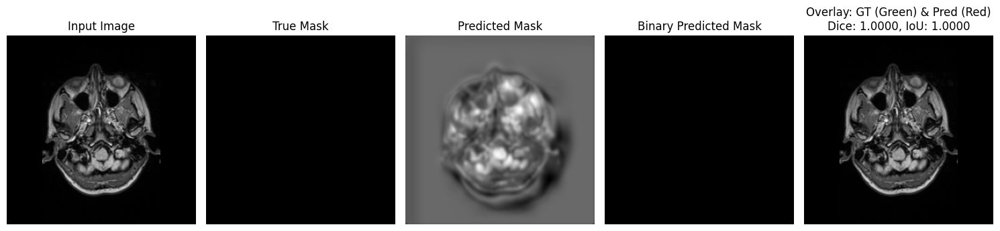

6.172839468068892e-09 6.172839468068892e-09


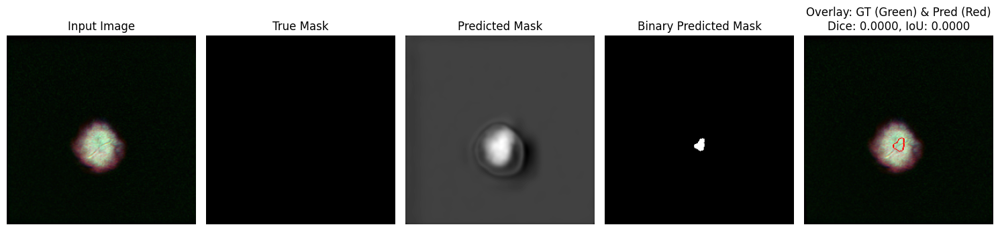

1.0 1.0


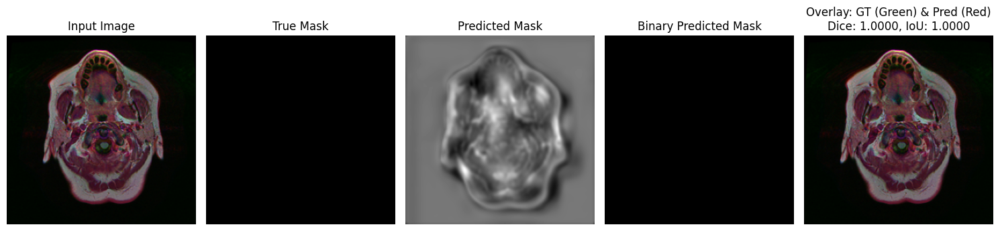

In [23]:
visualize_segmentation_new(model, test_dataloader, 10)